## 1. Personal Loan Modeling in Banking

### 1.1. Introduction

Nowadays with the growth in technology and analytics tools, companies need to find ways to improve their results without accumulating insignificant costs. Most companies analyze personal and transaction data to best understand customers’ needs and make informed speculations of future needs. Most technological savvy companies will deliver insights from analytics to customers based on the context of interest. These techniques could be used strategically to increase sales by effectively targeting specific customers for specific products.

Therefore, in this project, we attempt to predict the success rates of introducing personal loan offers to liability customers. Just to clarify on our terminology, liabilities are items that the bank owes to someone else, this generally includes customer deposits, and debts from other institutions. But a liability customer is a person or an entity that owes the bank. This mostly involves customers who owe the bank.

This case is about a bank (Thera Bank) whose stakeholders wish to explore methods of converting its liability customers to personal loan customers (while retaining them as depositors). They had initially run a campaign on this goal and noticed an interesting healthy conversion success rate of over 9%. This result encouraged the marketing department for retail customers to build a better model to increase the conversion success ratio with a minimal budget. This is where we come in.


### 1.2. Literature Review

### 1.3. Data Description and Methodology

The file Bank.xls contains data on 5000 customers. The data include customer demographic information (ID, Age, Experience, Income, etc.), the customer's relationship with the bank (mortgage, securities account, etc.), and the customer response to the last personal loan campaign (Personal Loan). We will talk more about these variables when we take a deep dive in data exploration.

Exploratory Data Analysis: We aim to explore the data's main aspects to easily target customers who will accept personal loan offers.

- Preparing the data to train a model: We will start by collecting data for 5000 customers of the bank and cleaning data for analysis using Python. 
- Model training and making predictions using a classification model: Would conduct analysis using Python to improve model accuracy and precision.
- Model evaluation: The final stage will be to evaluate (test) the model and ensure it works in properly identifying potential candidates for personal loans who will have a positive likelihood of accepting the bank's offer.

There are no empty values in the dataset. The dataset has a blend of numerical and categorical attributes, but all categorical data are represented with numbers. 


### 1.4. Data Attributes

- ID: Customer ID
- Age: Customer's age in completed years
- Experience: No. of years of professional experience
- Income: Annual income of the customer 
- ZIP Code: Home Address Zip Code
- Family: Family size of the customer
- CCAvg: Avg. Spending on Credit Card per Month
- Education: Education Level. 1: Undergrad; 2: Graduate; 3: Advanced / Professional
- Mortgage: Value of house mortgage if any
- Personal Loan: Did this customer accept the personal loan offered in the last campaign?
- Securities Account: Does the customer have a securities account with the bank?
- CD Account: Does the customer have a certificate of deposit (CD) account with the bank?
- Online: Does the customer use internet banking facilities?
- Credit Card: Does the customer use a credit card issued by this Bank?
- **NB**: Variables like **Income**, **CCAvg** and **Mortgage** are measured in **thousands of US dollars**

### 1.5. Methodology

Methodology chapter is a chapter where I will discuss on what kind of methods that I will use or apply for my research study. We will start off with importing data and proceed with exploratory data analysis. We will start by collecting data for 5000 customers of the bank and cleaning data for analysis using Python. We will import all the necessary packages to ensure our analysis run smoothly. 

After setting up the platform we will explore the data's main characteristics, structure, and content. This will involve summary statistics, finding outliers such as negative values, missing values, and verifying for invalid values to make sure everything is unique, test for noise in the dataset.

After dissecting and inspecting the data we will decide on data cleaning measures if applicable to ensure that data is ready for analysis.  We could verify the categorical attributes of the variables at hand to better understand the variables we are dealing with. At this point we will test for correlation between variables as we select our key variables (dependent and independent variables).  It will be good to visualize the relationships between the variables to set a better visual and statistical leverage for selecting our dependent and independent variables. These observations will give us better ideas on where to lean towards as we work on building a good model. 

When all has been put in place, there are various methods which we could go with building a good model for our prediction project. We could go with the classification models or the decision tree model. Splitting the data into training and test data will be key to test the final model’s performance capability of targeting customers who will be eligible for personal loan offers. Going by the rule of thumb the training data is 70% leaving 30% to test the model performance.

Training the model and making predictions using the preferred model of our choice. We would conduct analysis using Python, if need be, to improve model accuracy and precision.

The final phase will be evaluating the model to ensure it functions properly in helping the bank better identify potential candidates for personal loans offers who will have a positive likelihood of accepting the bank's offer. We would be able to compare models to see which will have the most accurate prediction capability for our projects goal.

### 1.6. Objectives

In this project, we attempt to predict whether a personal loan offer to a liability customer (customer who has no debt engagement with the bank) for a Bank is likely to result in success. We believe that this research will go a long way to build stronger relationships between the bank and its customers, personal loan customers will positively impact the bank's profitability currently and in the long run.

## 2. Exploratory Data Analysis

### 2.1. Load Libraries

In [1]:
# Built-in packages
import json
import warnings
warnings.filterwarnings("ignore")

# Third party packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.offline import iplot

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier


sns.set(context= "notebook", color_codes=True)
plt.style.use('bmh')

pyo.init_notebook_mode()

%matplotlib inline

### 2.2. Import Data

**Read and visualize data as a data frame**

In [2]:
# Read the Data
data = pd.read_csv('C:/Users/LENOVO/Desktop/Python/ANA 555/Bank_Personal_Loan_Modelling.csv')
data.head(10)

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
5,6,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
6,7,53,27,72,91711,2,1.5,2,0,0,0,0,1,0
7,8,50,24,22,93943,1,0.3,3,0,0,0,0,0,1
8,9,35,10,81,90089,3,0.6,2,104,0,0,0,1,0
9,10,34,9,180,93023,1,8.9,3,0,1,0,0,0,0


In [3]:
# import os # importing directory command
# os.getcwd() # identifying/display current directory

In [4]:
# os.chdir('C:\\Users\\LENOVO\\Desktop\\Python\\ANA 555') # Changing current directory

### 2.3. Data Exploration

In [5]:
# Let's explore the shape of the data. 
data.shape

(5000, 14)

The shape of the DatFrame is: (5000, 14), which means there are 5000 rows and 14 columns.

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal Loan       5000 non-null   int64  
 10  Securities Account  5000 non-null   int64  
 11  CD Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


We have **13** integer columns, 1 **float** column out of which personal_loan, securities_account, cd_account, online, creditcard have **binary values**.

The column **personal_loan** is our target variable.

**Information on the features or attributes**           
The attributes can be divided accordingly :

- The variable **ID** does not add any interesting information. *There is no association between a person's customer ID and loan, also it does not provide any general conclusion for future potential loan customers*. We can neglect this information for our model prediction.

The binary category have **five** variables as below:

- **Personal Loan** - Did this customer accept the personal loan offered in the last campaign? **This is our target variable**
- **Securities Account** - Does the customer have a securities account with the bank?
- **CD Account** - Does the customer have a certificate of deposit (CD) account with the bank?
- **Online** - Does the customer use internet banking facilities?
- **Credit Card** - Does the customer use a credit card issued by UniversalBank?

Ordinal Categorical Variables are:

- **Family** - Family size of the customer
- **Education** - education level of the customer

Interval (numeric) variables are as below:

- **Age** - Age of the customer
- **Experience** - Years of experience
- **Income** - Annual income in dollars
- **CCAvg** - Average credit card spending
- **Mortage** - Value of House Mortgage

The nominal variable is :

- **ID**
- **Zip Code**

**Basic Data Summary Statistics**

In [7]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIP Code,5000.0,93152.503000,2121.852197,9307.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
Personal Loan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


We notice that our **Experience** variable has a negtive value. This is not logical. We will need to take note and make necessary adjustments before we begin analysis.

**Identifying Unique Data**

In [8]:
data.apply(lambda x: len(x.unique()))

ID                    5000
Age                     45
Experience              47
Income                 162
ZIP Code               467
Family                   4
CCAvg                  108
Education                3
Mortgage               347
Personal Loan            2
Securities Account       2
CD Account               2
Online                   2
CreditCard               2
dtype: int64

**Identifying Variable Relationships**

We decided to use the Pair plot to understand the best set of features which would explain the **relationship between two variables** or those which have the most separated clusters. This method can be used to **form simple classification models** by drawing simple lines or make linear separation in our data-set.

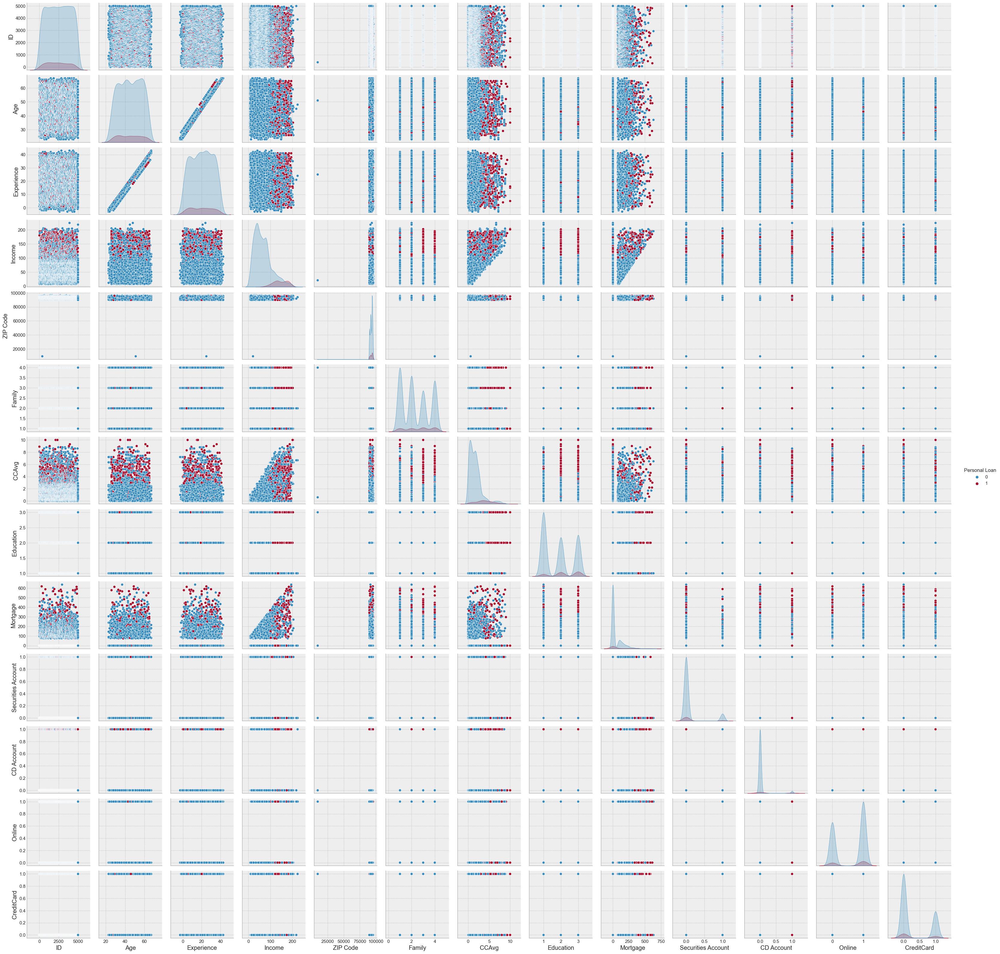

In [9]:
#display pair plot
sns.pairplot(data = data, hue='Personal Loan')
plt.show()

- **Age** feature is normally distributed with majority of customers falling between 30 years and 60 years of age. We can confirm this by looking at the describe statement above, which shows **mean** is almost equal to **median**.
- **Experience** is normally distributed with more customer having experience starting from 8 years. Here the mean is equal to median. There are negative values in the Experience. This could be a data input error as in general it is not possible to measure negative years of experience. We can delete these values, because we have 3 or 4 records from the sample.
- **Income** is positively skewed. Majority of the customers have income between 45K and 55K. We can confirm this by saying the mean is greater than the median. From above pair plot we believe customers with higher income are likely probable to accept Personal Loan offers.
- **CCAvg** is also a positively skewed variable and average spending is between 0K to 10K and majority spends less than 2.5K.
- **Mortgage** 70% of the individuals have a mortgage of less than 40K. However the max value is 635K.
- The variables **family** and **education** are **ordinal variables**. The distribution of families is **evenly distributed**.
- From above pair plot we could decern that customers with higher income are more likely to accept Personal Loan offers.

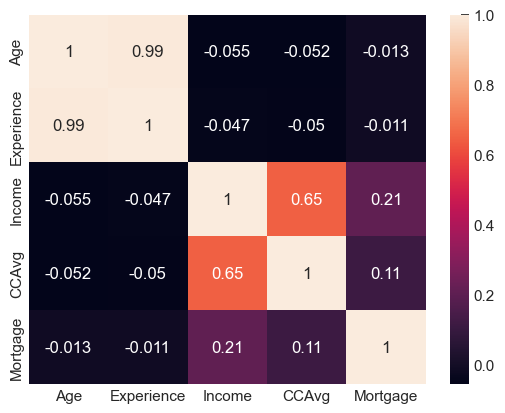

In [10]:
# Using the Heat Map for a select interval variables 
df = pd.DataFrame(data,columns=['Age','Experience','Income','CCAvg','Mortgage'])
corrMatrix = df.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

**Observation:** By looking above plots we can see that **'Age' has very strong and possitive association with 'Experience'**. I am also considering 'Education' to fix the negative experience error. Becuase as we know experience relats to the education level.

**Decission:** We can replace each negative 'Experience' value with the median of possitive 'Experience' associated with the particular 'Age' and 'Education' value.

### 2.4 Data Preparation

**Dropping Unecessary Data**
- We see that a lot of categorical columns are being treated as integer datatypes. We'd like to convert them to categorical for our analysis.
- First, we'd like to drop 2 columns that we think are not relevant to the prediction: 'ID' and 'ZIP Code'

In [11]:
data.drop(['ID', 'ZIP Code'], axis = 1, inplace = True)

**Experience cannot be negative** 

Let us take a look and make adjsutments accordingly.

In [12]:
data[data['Experience'] < 0]['Experience'].value_counts()

-1    33
-2    15
-3     4
Name: Experience, dtype: int64

In [13]:
# There are 52 records with negative experience. We will need to clean data before proceeding.
data[data['Experience'] < 0]['Experience'].count()

52

In [14]:
#printing the rows with negative Experience values
data[data['Experience'] < 0 ]

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
89,25,-1,113,4,2.30,3,0,0,0,0,0,1
226,24,-1,39,2,1.70,2,0,0,0,0,0,0
315,24,-2,51,3,0.30,3,0,0,0,0,1,0
451,28,-2,48,2,1.75,3,89,0,0,0,1,0
524,24,-1,75,4,0.20,1,0,0,0,0,1,0
536,25,-1,43,3,2.40,2,176,0,0,0,1,0
540,25,-1,109,4,2.30,3,314,0,0,0,1,0
576,25,-1,48,3,0.30,3,0,0,0,0,0,1
583,24,-1,38,2,1.70,2,0,0,0,0,1,0
597,24,-2,125,2,7.20,1,0,0,1,0,0,1


In [15]:
# Experience is negative for 52 rows and it's not realistic. We will need to change these to positive values

data['Experience']= abs(data['Experience'])

**Dividing the columns in the dataset in to numeric and categorical attributes.**

In [16]:
cols = set(data.columns)
cols_numeric = set(['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage'])
cols_categorical = list(cols - cols_numeric)
cols_categorical

['Securities Account',
 'Personal Loan',
 'Online',
 'Family',
 'Education',
 'CreditCard',
 'CD Account']

In [17]:
for x in cols_categorical:
    data[x] = data[x].astype('category')

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Age                 5000 non-null   int64   
 1   Experience          5000 non-null   int64   
 2   Income              5000 non-null   int64   
 3   Family              5000 non-null   category
 4   CCAvg               5000 non-null   float64 
 5   Education           5000 non-null   category
 6   Mortgage            5000 non-null   int64   
 7   Personal Loan       5000 non-null   category
 8   Securities Account  5000 non-null   category
 9   CD Account          5000 non-null   category
 10  Online              5000 non-null   category
 11  CreditCard          5000 non-null   category
dtypes: category(7), float64(1), int64(4)
memory usage: 230.6 KB


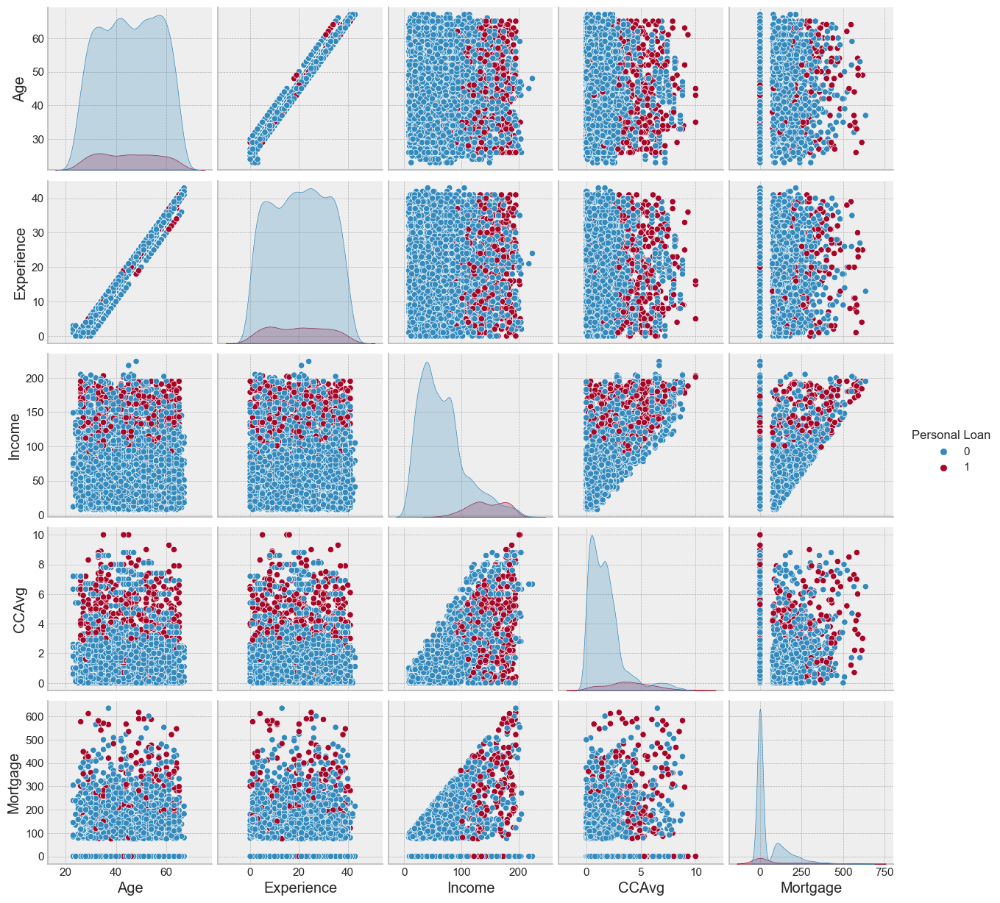

In [18]:
#display pair plot
sns.pairplot(data = data, hue='Personal Loan')
plt.show()

In [19]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,45.338400,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,20.134600,11.415189,0.0,10.0,20.0,30.0,43.0
Income,5000.0,73.774200,46.033729,8.0,39.0,64.0,98.0,224.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.7,1.5,2.5,10.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.0,0.0,101.0,635.0


In [20]:
# Number of people with zero CCAvg.

df[df['CCAvg']==0]['CCAvg'].value_counts()

0.0    106
Name: CCAvg, dtype: int64

**Influence of Income and Education variables on Personal Loan**

<AxesSubplot:xlabel='Education', ylabel='Income'>

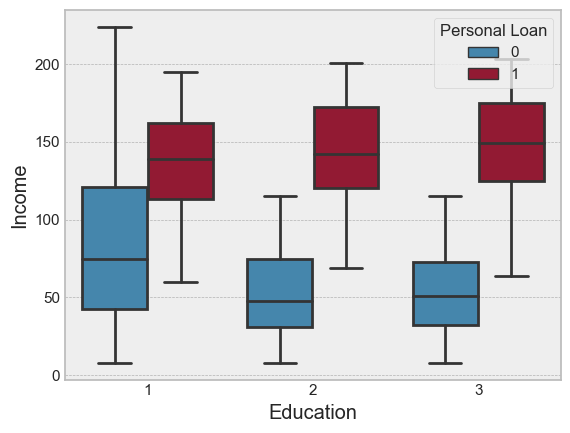

In [21]:
sns.boxplot(x='Education',y='Income',hue='Personal Loan', data=data)

**Observation :** It seems the customers whose education level is 1 are having more income and less suceptible than those with lower income. However customers who has taken the personal loan have similar income levels except for those with education of 1.

**Influence of Education and Mortgage variables on Personal Loan**

<AxesSubplot:xlabel='Education', ylabel='Mortgage'>

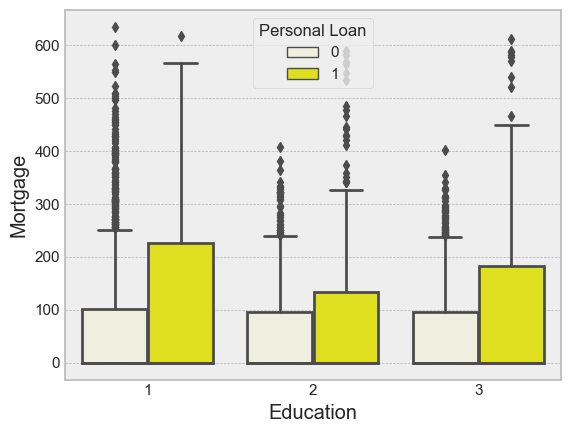

In [22]:
sns.boxplot(x="Education", y='Mortgage', hue="Personal Loan", data=data,color='yellow')

**Observation:** From the above chart it seems that customers who do not have personal loan and customers who currently have personal loans all have a high mortgage.

**Influence of Education and Mortgage variables on Personal Loan**

<AxesSubplot:xlabel='Education', ylabel='Age'>

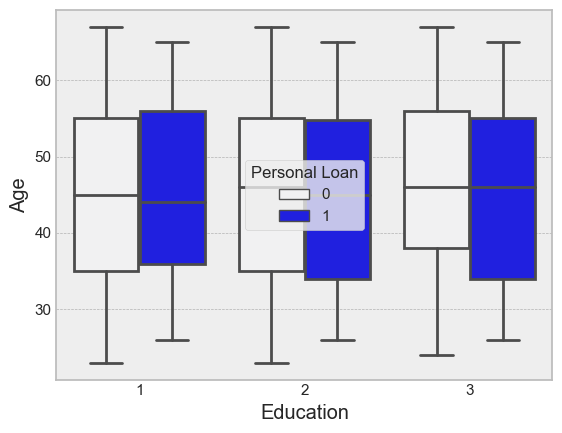

In [23]:
sns.boxplot(x="Education", y='Age', hue="Personal Loan", data=data,color='blue')

**Observation:** Younger customers have slightly more personal loans than older customers who are equally educated.

**Influence of Education and Credit Card Spending variables on Personal Loan**

<AxesSubplot:xlabel='Education', ylabel='CCAvg'>

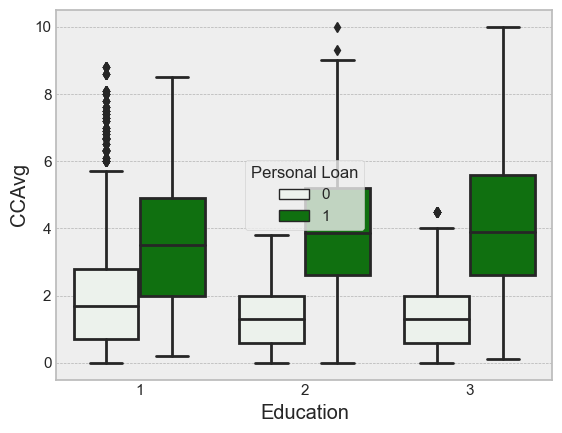

In [24]:
sns.boxplot(x="Education", y='CCAvg', hue="Personal Loan", data=data,color='green')

**Observation:** People with a higher average card monthly expenditure have personal loans. Customers without personal loans spend less on credit cards.

<AxesSubplot:xlabel='Securities Account', ylabel='count'>

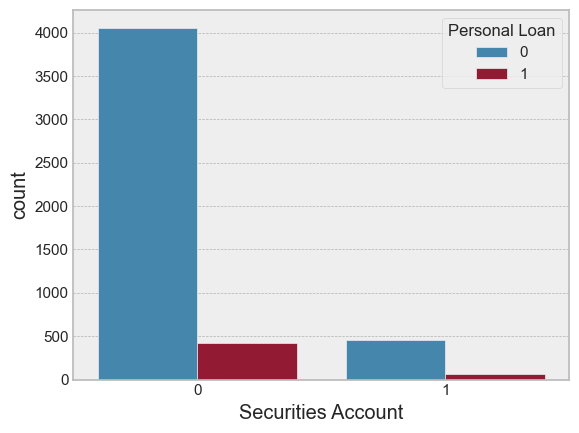

In [25]:
sns.countplot(x="Securities Account", data=data,hue="Personal Loan")

**Observation :** Majority of customers who does not have loan have securities account.

<AxesSubplot:xlabel='Family', ylabel='count'>

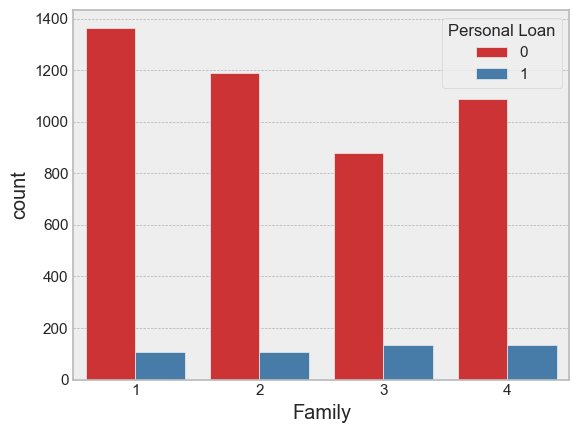

In [26]:
sns.countplot(x='Family',data=data,hue='Personal Loan',palette='Set1')

**Observation:** Family size does not impact the possibility of personal loan. But it seems families with size of 3 are more likely to take personal loans than a family of 1. ***When considering future campaign this might be good association.***

<AxesSubplot:xlabel='CD Account', ylabel='count'>

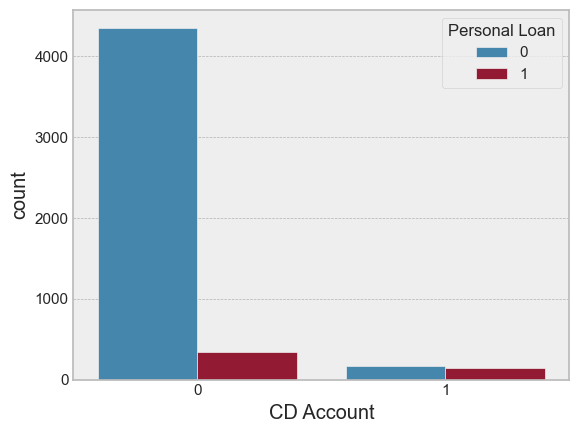

In [27]:
sns.countplot(x='CD Account',data=data,hue='Personal Loan')

**Observation:** The majority of customers who do not have CD account do not have personal loans as well. Almost all customers who has CD account have a personal loan as well.

<AxesSubplot:xlabel='CreditCard', ylabel='count'>

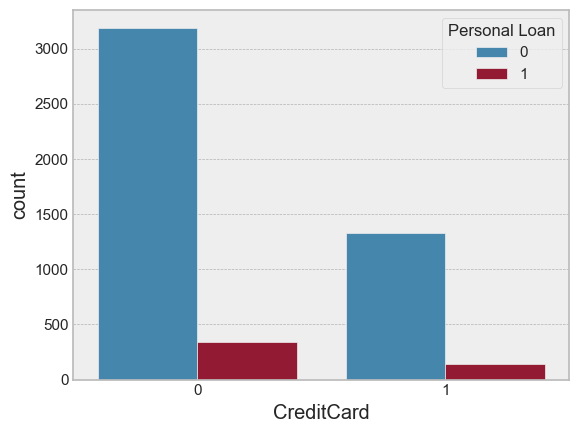

In [28]:
sns.countplot(x='CreditCard',data=data,hue='Personal Loan')

**Observation:** Credit card usage compared to personal loans will have a relatively low importance in our analysis.

<AxesSubplot:xlabel='Online', ylabel='count'>

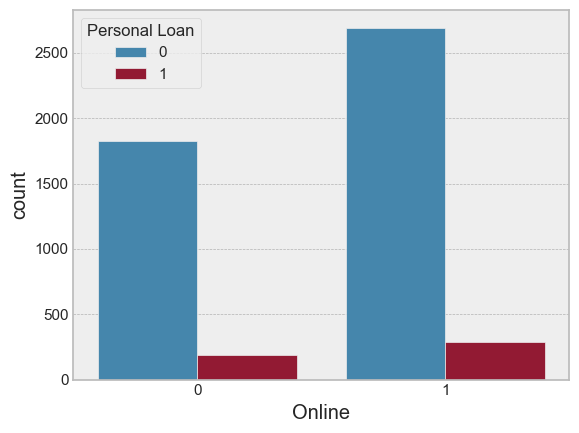

In [29]:
sns.countplot(x='Online',data=data,hue='Personal Loan')

**Observation:** Customer online usage compared to personal loans will have a relatively low importance in our analysis.

## 3. Applying Models

### 3.1. Split data into Train and Test

First, we will need to specify the dependent variable **(y)** and the independent variable(s) **(X)**.
y will represent **Personal Loans** which is our variable of interest and the other variables Age, Experience, Income, family, CCAvg, Education, Mortgage, Securities Account, CD Account, Online and Credit Card will represent the independent variables.

In [30]:
X = data.drop('Personal Loan',axis=1)
y = data['Personal Loan']

Secondly, we will need to create a **train** and a **test** set from the data.

In [31]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.20,random_state=1)

In [32]:
print("The training feature are {} % of dataset and training labels are {} % of dataset".format(((X_train.shape[0]/5000)*100),((y_train.shape[0]/5000)*100)))
print("The test feature are {} % of dataset and test labels are {} % of dataset".format(((X_test.shape[0]/5000)*100),((y_test.shape[0]/5000)*100)))

The training feature are 80.0 % of dataset and training labels are 80.0 % of dataset
The test feature are 20.0 % of dataset and test labels are 20.0 % of dataset


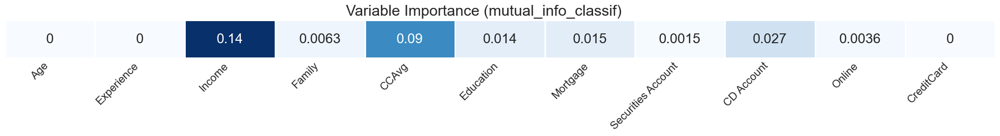

In [33]:
from sklearn.feature_selection import mutual_info_classif
mutual_information = mutual_info_classif(X_train, y_train, n_neighbors=5, copy = True)

plt.subplots(1, figsize=(26, 1))
sns.heatmap(mutual_information[:, np.newaxis].T, cmap='Blues', cbar=False, linewidths=1, annot=True, annot_kws={"size": 20})
plt.yticks([], [])
plt.gca().set_xticklabels(X_train.columns, rotation=45, ha='right', fontsize=16)
plt.suptitle("Variable Importance (mutual_info_classif)", fontsize=22, y=1.2)
plt.gcf().subplots_adjust(wspace=0.2)

Text(0.5, 0, 'Variable Relative Importance')

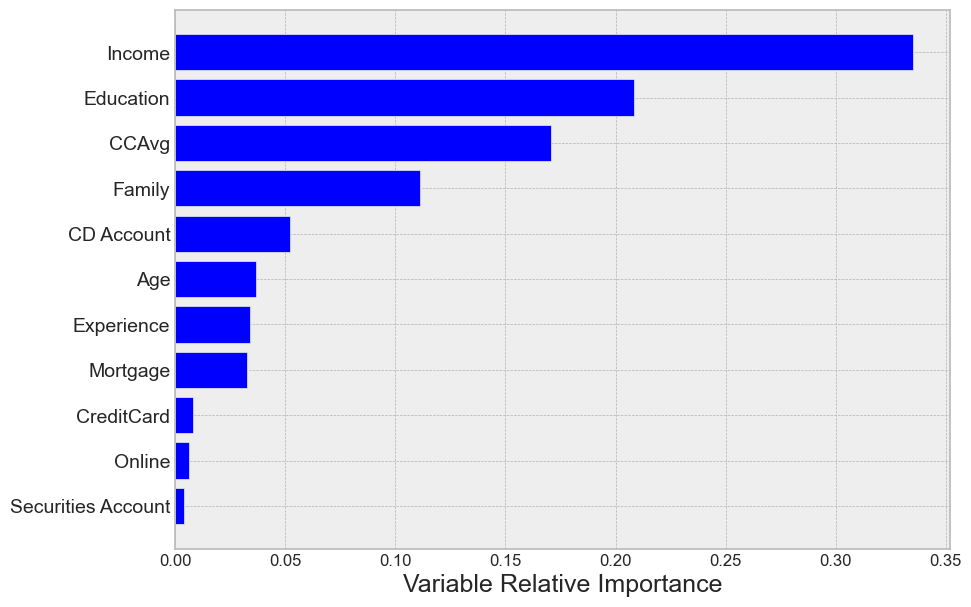

In [34]:
rf_clf = RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=42)
rf_clf.fit(X_train, y_train)

features = list(X_train.columns)
importances = rf_clf.feature_importances_
indices = np.argsort(importances)

fig, ax = plt.subplots(figsize=(10, 7))
plt.barh(range(len(indices)), importances[indices], color='blue', align='center')
ax.tick_params(axis="x", labelsize=12)
ax.tick_params(axis="y", labelsize=14)
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Variable Relative Importance', fontsize = 18)

**Observation:** Using the relative importance analysis, we can quickly identify the relative importance of these variables for our analysis. We can see clearly that Income, education, Average credit card spending per month, family size and CD accounts which exceed 0.05. This is useful in building a good model.

### 3.2. Logistic Regression 

In [35]:
#importing the library
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,recall_score,precision_score,f1_score 

In [36]:
#lr = LogisticRegression() #Instantiate the LogisticRegression object
#lr.fit(X_train,y_train) #call the fit method of logistic regression to train the model or to learn the parameters of model

In [37]:
#y_predict = lr.predict(X_test) #predicting the result of test dataset and storing in a variable called y_predict

In [38]:
#print(accuracy_score(y_test,y_predict))#printing overall accuracy score

In [39]:
#print("Confusion matrix")
#print(confusion_matrix(y_test,y_predict))#creating confusion matrix

**Observation:** The confusion matrix is a square matrix which will help us to know the class level accuracy so in our test dataset total **1500** entities/customers are there. 
- Therefore **1333 + 18 = 1351**, means 1351 customers out of 1500 customers **will not accept the personal loan offer.**
- Our model predicts that **1333** of **1351** who did not accept personal loan would be accurately predicted but **18** customers are suspected to have a wrong prediction by the model.
- Calculating **66 + 83 = 149**, means **149** customers out of 1500 customers **will accept personal loan offers**.
- Our model also predicts that **83** customers out of **149** who accepted the personal loan would be accurately predicted but **66** customers are suspected to have a wrong prediction by the model.

In [40]:
# Displaying precision,recall and f1 score
#print("precision:",precision_score(y_test,y_predict))
#print("recall   :",recall_score(y_test,y_predict))
#print("f1 score :",f1_score(y_test,y_predict))

In [41]:
#for idx, col_name in enumerate(X_train.columns):
#  print("The coefficient for {} is {}".format(col_name, lr.coef_[0][idx]))

In [42]:
#print("The intercept is {}".format(lr.intercept_))

**Observation:** So in logistic regression our hypothesis is h(z) = 1/(1+e^(-z)). where z = *-0.47Age + 0.47Experience + 0.048Income + 0.65family + 0.20CCAvg + 1.62Education + 0.00087Mortgage + -0.45Securities Account + 2.84CD Account + -0.64Online + -1.04*CreditCard + -0.62.* so above hypothesis give probability if probability is>=0.5 then we will classify as 1 else 0.

# New approach starts here!!!!!


In [43]:
# from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

X_train_num = X_train.select_dtypes(include='number')
X_train_cat = X_train.select_dtypes(include='category')

num_attribs = list(X_train_num.columns)
cat_attribs = list(X_train_cat.columns)

transformer = ColumnTransformer([
        ("num", StandardScaler(), num_attribs),
        ("cat", OneHotEncoder(), cat_attribs),
    ])

X_train = transformer.fit_transform(X_train)
print(X_train.shape)
X_train[1, :]

(4000, 20)


array([-0.81450588, -1.23801424, -1.05597078, -0.72546797, -0.55564766,
        1.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  1.        ,  1.        ,  0.        ,  1.        ,
        0.        ,  0.        ,  1.        ,  1.        ,  0.        ])

In [44]:
y_train = np.array(y_train)
print(y_train.shape)

(4000,)


## 4. Training Models

In [45]:
def train_model(model):
    m = model[1]
    y_train_pred = cross_val_predict(model[1], X_train, y_train, cv=5)
    cm = confusion_matrix(y_train, y_train_pred)
    print('Confusion matrix: ' + model[0])
    print(cm)
    print()
    accuracy = accuracy_score(y_train, y_train_pred)
    precision = precision_score(y_train, y_train_pred)
    recall = recall_score(y_train, y_train_pred)
    f1 = f1_score(y_train, y_train_pred)
    print(f'{model[0]} Accuracy: {accuracy}')
    print(f'{model[0]} Precision: {precision}')
    print(f'{model[0]} Recall: {recall}')
    print(f'{model[0]} f1 - score: {f1}')

In [46]:
def train_model(model):
    m = model[1]
    y_train_pred = cross_val_predict(model[1], X_train, y_train, cv=5)
    cm = confusion_matrix(y_train, y_train_pred)
    print('Confusion matrix: ' + model[0])
    print(cm)
    print()
    accuracy = accuracy_score(y_train, y_train_pred)
    precision = precision_score(y_train, y_train_pred)
    recall = recall_score(y_train, y_train_pred)
    f1 = f1_score(y_train, y_train_pred)
    print(f'{model[0]} Accuracy: {accuracy}')
    print(f'{model[0]} Precision: {precision}')
    print(f'{model[0]} Recall: {recall}')
    print(f'{model[0]} f1 - score: {f1}')

In [47]:
train_model(('Gaussian Naive Bayes', GaussianNB()))

Confusion matrix: Gaussian Naive Bayes
[[3406  214]
 [ 184  196]]

Gaussian Naive Bayes Accuracy: 0.9005
Gaussian Naive Bayes Precision: 0.47804878048780486
Gaussian Naive Bayes Recall: 0.5157894736842106
Gaussian Naive Bayes f1 - score: 0.49620253164556966


In [48]:
train_model(('Logistic Regression', LogisticRegression(solver="liblinear")))

Confusion matrix: Logistic Regression
[[3586   34]
 [ 120  260]]

Logistic Regression Accuracy: 0.9615
Logistic Regression Precision: 0.8843537414965986
Logistic Regression Recall: 0.6842105263157895
Logistic Regression f1 - score: 0.771513353115727


In [49]:
train_model(('k Nearest Neighbor', KNeighborsClassifier(n_neighbors= 7, weights = 'distance' )))

Confusion matrix: k Nearest Neighbor
[[3616    4]
 [ 174  206]]

k Nearest Neighbor Accuracy: 0.9555
k Nearest Neighbor Precision: 0.9809523809523809
k Nearest Neighbor Recall: 0.5421052631578948
k Nearest Neighbor f1 - score: 0.6983050847457628


In [50]:
train_model(('SVM', SVC(gamma='auto')))

Confusion matrix: SVM
[[3619    1]
 [  91  289]]

SVM Accuracy: 0.977
SVM Precision: 0.996551724137931
SVM Recall: 0.7605263157894737
SVM f1 - score: 0.862686567164179


In [51]:
train_model(('CART', DecisionTreeClassifier()))

Confusion matrix: CART
[[3591   29]
 [  33  347]]

CART Accuracy: 0.9845
CART Precision: 0.9228723404255319
CART Recall: 0.9131578947368421
CART f1 - score: 0.9179894179894179


In [52]:
train_model(('Random Forest', RandomForestClassifier(n_estimators=100, random_state=42)))

Confusion matrix: Random Forest
[[3615    5]
 [  43  337]]

Random Forest Accuracy: 0.988
Random Forest Precision: 0.9853801169590644
Random Forest Recall: 0.8868421052631579
Random Forest f1 - score: 0.9335180055401662


## 5. Model Selection and Tuning

In [53]:
from sklearn.model_selection import GridSearchCV

param_grid = [
    {'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
  ]

forest_reg = RandomForestClassifier(random_state=42)
# train across 5 folds, that's a total of (12+6)*5=90 rounds of training 
grid_search = GridSearchCV(forest_reg, param_grid, cv=5,
                           scoring='f1',
                           return_train_score=True)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid=[{'max_features': [2, 4, 6, 8],
                          'n_estimators': [3, 10, 30]},
                         {'bootstrap': [False], 'max_features': [2, 3, 4],
                          'n_estimators': [3, 10]}],
             return_train_score=True, scoring='f1')

In [54]:
grid_search.best_params_

{'max_features': 8, 'n_estimators': 30}

In [55]:
rf_clf = grid_search.best_estimator_

In [56]:
X_test = transformer.fit_transform(X_test)
print(X_test.shape)

(1000, 20)


In [57]:
y_test = np.array(y_test)
print(y_test.shape)

(1000,)


In [58]:
rf_clf.fit(X_test, y_test)

RandomForestClassifier(max_features=8, n_estimators=30, random_state=42)

In [59]:
y_test_predict = rf_clf.predict(X_test)

In [60]:
rf_clf.score(X_test, y_test)

1.0

In [61]:
print(metrics.classification_report(y_test, y_test_predict, labels=[1, 0]))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00       100
           0       1.00      1.00      1.00       900

    accuracy                           1.00      1000
   macro avg       1.00      1.00      1.00      1000
weighted avg       1.00      1.00      1.00      1000

